# Car Price prediction

<img src="https://whatcar.vn/media/2018/09/car-lot-940x470.jpg"/>

## Прогнозирование стоимости автомобиля по характеристикам
*Этот ноутбук является шаблоном (Baseline) к текущему соревнованию и не служит готовым решением!*   
Вы можете использовать его как основу для построения своего решения.


> **Baseline** создается больше как шаблон, где можно посмотреть, как происходит обращение с входящими данными и что нужно получить на выходе. При этом ML начинка может быть достаточно простой. Это помогает быстрее приступить к самому ML, а не тратить ценное время на инженерные задачи. 
Также baseline является хорошей опорной точкой по метрике. Если наше решение хуже baseline -  мы явно делаем что-то не так и стоит попробовать другой путь) 

## В baseline мы сделаем следующее:
* Построим "наивную"/baseline модель, предсказывающую цену по модели и году выпуска (с ней будем сравнивать другие модели)
* Обработаем и отнормируем признаки
* Сделаем первую модель на основе градиентного бустинга с помощью CatBoost
* Сделаем вторую модель на основе нейронных сетей и сравним результаты
* Сделаем multi-input нейронную сеть для анализа табличных данных и текста одновременно
* Добавим в multi-input сеть обработку изображений
* Осуществим ансамблирование градиентного бустинга и нейронной сети (усреднение их предсказаний)

In [1]:
!pip install -q tensorflow==2.3

In [2]:
#аугментации изображений
!pip install albumentations -q

In [3]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import random
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import sys
import PIL
import cv2
import re

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

from catboost import CatBoostRegressor
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import f_classif, mutual_info_classif

# # keras
import tensorflow as tf
import tensorflow.keras.layers as L
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing import sequence
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import albumentations

# plt
import matplotlib.pyplot as plt
#увеличим дефолтный размер графиков
from pylab import rcParams
rcParams['figure.figsize'] = 5, 5
#графики в svg выглядят более четкими
%config InlineBackend.figure_format = 'svg' 
%matplotlib inline
import seaborn as sns

from pandas import Series

import string
import nltk
from nltk.tokenize import RegexpTokenizer
from nltk.stem import WordNetLemmatizer
from nltk.stem.snowball import RussianStemmer
from nltk.corpus import stopwords, words

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [4]:
print('Python       :', sys.version.split('\n')[0])
print('Numpy        :', np.__version__)
print('Tensorflow   :', tf.__version__)

Python       : 3.7.6 | packaged by conda-forge | (default, Mar 23 2020, 23:03:20) 
Numpy        : 1.18.5
Tensorflow   : 2.3.0


In [5]:
def mape(y_true, y_pred):
    return np.mean(np.abs((y_pred-y_true)/y_true))

In [6]:
# всегда фиксируйте RANDOM_SEED, чтобы ваши эксперименты были воспроизводимы!
RANDOM_SEED = 42
np.random.seed(RANDOM_SEED)

In [7]:
!pip freeze > requirements.txt

# DATA

Посмотрим на типы признаков:

* bodyType - категориальный
* brand - категориальный
* color - категориальный
* description - текстовый
* engineDisplacement - числовой, представленный как текст
* enginePower - числовой, представленный как текст
* fuelType - категориальный
* mileage - числовой
* modelDate - числовой
* model_info - категориальный
* name - категориальный, желательно сократить размерность
* numberOfDoors - категориальный
* price - числовой, целевой
* productionDate - числовой
* sell_id - изображение (файл доступен по адресу, основанному на sell_id)
* vehicleConfiguration - не используется (комбинация других столбцов)
* vehicleTransmission - категориальный
* Владельцы - категориальный
* Владение - числовой, представленный как текст
* ПТС - категориальный
* Привод - категориальный
* Руль - категориальный

In [8]:
DATA_DIR = '../input/sf-dst-car-price-prediction-part2/'
train = pd.read_csv(DATA_DIR + 'train.csv')
test = pd.read_csv(DATA_DIR + 'test.csv')
sample_submission = pd.read_csv(DATA_DIR + 'sample_submission.csv')

In [9]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6682 entries, 0 to 6681
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   bodyType              6682 non-null   object 
 1   brand                 6682 non-null   object 
 2   color                 6682 non-null   object 
 3   description           6682 non-null   object 
 4   engineDisplacement    6682 non-null   object 
 5   enginePower           6682 non-null   object 
 6   fuelType              6682 non-null   object 
 7   mileage               6682 non-null   int64  
 8   modelDate             6682 non-null   int64  
 9   model_info            6682 non-null   object 
 10  name                  6682 non-null   object 
 11  numberOfDoors         6682 non-null   int64  
 12  price                 6682 non-null   float64
 13  productionDate        6682 non-null   int64  
 14  sell_id               6682 non-null   int64  
 15  vehicleConfiguration 

In [10]:
train.nunique()

bodyType                  17
brand                      3
color                     16
description             6147
engineDisplacement        48
enginePower              146
fuelType                   4
mileage                 2900
modelDate                 41
model_info               118
name                     900
numberOfDoors              4
price                   1628
productionDate            38
sell_id                 6682
vehicleConfiguration     288
vehicleTransmission        4
Владельцы                  3
Владение                 173
ПТС                        2
Привод                     3
Руль                       2
dtype: int64

# Model 1: Создадим "наивную" модель 
Эта модель будет предсказывать среднюю цену по модели и году выпуска. 
C ней будем сравнивать другие модели.



In [11]:
# split данных
data_train, data_test = train_test_split(train, test_size=0.15, shuffle=True, random_state=RANDOM_SEED)

In [12]:
# Наивная модель
predicts = []
for index, row in pd.DataFrame(data_test[['model_info', 'productionDate']]).iterrows():
    query = f"model_info == '{row[0]}' and productionDate == '{row[1]}'"
    predicts.append(data_train.query(query)['price'].median())

# заполним не найденные совпадения
predicts = pd.DataFrame(predicts)
predicts = predicts.fillna(predicts.median())

# округлим
predicts = (predicts // 1000) * 1000

#оцениваем точность
print(f"Точность наивной модели по метрике MAPE: {(mape(data_test['price'], predicts.values[:, 0]))*100:0.2f}%")

Точность наивной модели по метрике MAPE: 19.88%


# EDA

Проведем быстрый анализ данных для того, чтобы понимать, сможет ли с этими данными работать наш алгоритм.

Посмотрим, как выглядят распределения числовых признаков:

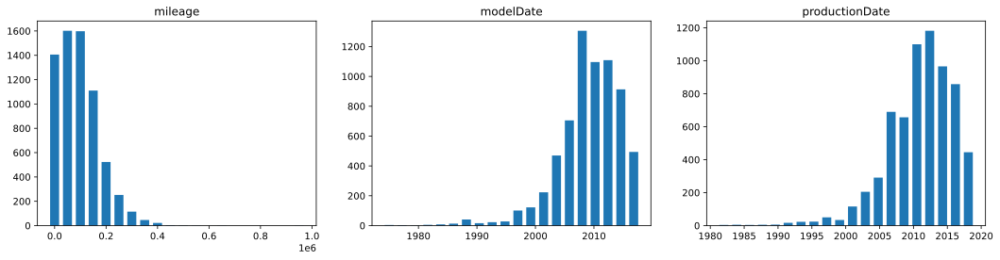

In [13]:
#посмотрим, как выглядят распределения числовых признаков
def visualize_distributions(titles_values_dict):
  columns = min(3, len(titles_values_dict))
  rows = (len(titles_values_dict) - 1) // columns + 1
  fig = plt.figure(figsize = (columns * 6, rows * 4))
  for i, (title, values) in enumerate(titles_values_dict.items()):
    hist, bins = np.histogram(values, bins = 20)
    ax = fig.add_subplot(rows, columns, i + 1)
    ax.bar(bins[:-1], hist, width = (bins[1] - bins[0]) * 0.7)
    ax.set_title(title)
  plt.show()

visualize_distributions({
    'mileage': train['mileage'].dropna(),
    'modelDate': train['modelDate'].dropna(),
    'productionDate': train['productionDate'].dropna()
})

Итого:
* CatBoost сможет работать с признаками и в таком виде, но для нейросети нужны нормированные данные.

# PreProc Tabular Data

In [14]:
#используем все текстовые признаки как категориальные без предобработки
categorical_features = ['bodyType', 'brand', 'color', 'engineDisplacement', 'enginePower', 'fuelType', 'model_info', 'name',
  'numberOfDoors', 'vehicleTransmission', 'Владельцы', 'Владение', 'ПТС', 'Привод', 'Руль']

#используем все числовые признаки
numerical_features = ['mileage', 'modelDate', 'productionDate']

In [15]:
# ВАЖНО! дря корректной обработки признаков объединяем трейн и тест в один датасет
train['sample'] = 1 # помечаем где у нас трейн
test['sample'] = 0 # помечаем где у нас тест
test['price'] = 0 # в тесте у нас нет значения price, мы его должны предсказать, поэтому пока просто заполняем нулями

data = test.append(train, sort=False).reset_index(drop=True) # объединяем
print(train.shape, test.shape, data.shape)

(6682, 23) (1671, 23) (8353, 23)


In [16]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8353 entries, 0 to 8352
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   bodyType              8353 non-null   object 
 1   brand                 8353 non-null   object 
 2   color                 8353 non-null   object 
 3   description           8353 non-null   object 
 4   engineDisplacement    8353 non-null   object 
 5   enginePower           8353 non-null   object 
 6   fuelType              8353 non-null   object 
 7   mileage               8353 non-null   int64  
 8   modelDate             8353 non-null   int64  
 9   model_info            8353 non-null   object 
 10  name                  8353 non-null   object 
 11  numberOfDoors         8353 non-null   int64  
 12  productionDate        8353 non-null   int64  
 13  sell_id               8353 non-null   int64  
 14  vehicleConfiguration  8353 non-null   object 
 15  vehicleTransmission  

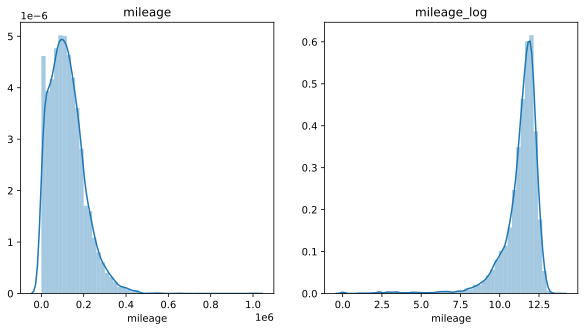

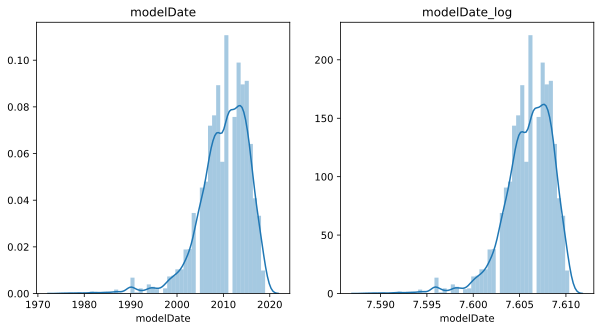

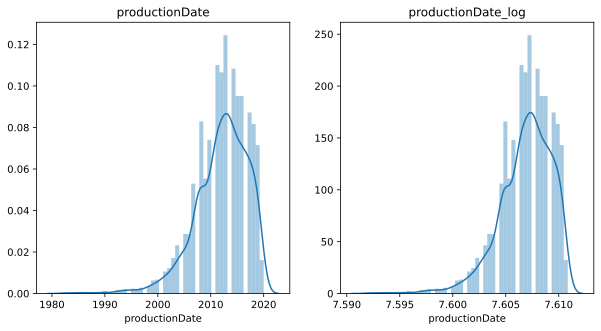

In [17]:
#сравним числовые признаки с логарифмированными числовыми признаками

def visualize_distributions_sns(titles_values_dict):
    for i, (title, values) in enumerate(titles_values_dict.items()):
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.title(title)
        sns.distplot(values)
        plt.subplot(1, 2, 2)
        plt.title(title+'_log')
        sns.distplot(np.log(values))



visualize_distributions_sns({
    'mileage': train['mileage'].dropna(),
    'modelDate': train['modelDate'].dropna(),
    'productionDate': train['productionDate'].dropna()
})




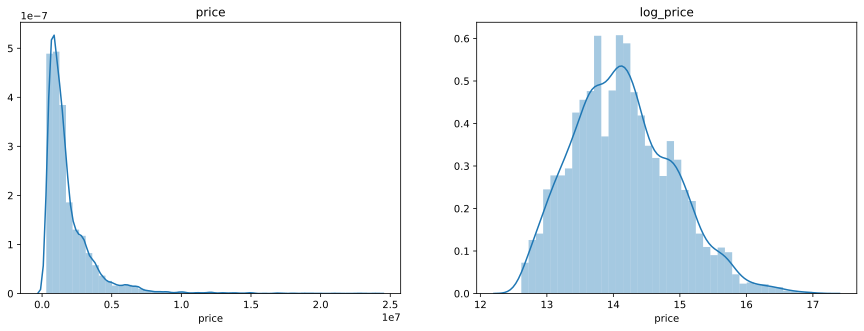

In [18]:
# Посмотрим на распределения целевой переменной и логарифмированной ее версии
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.title('price')
sns.distplot(data[data['sample'] == 1].price)
plt.subplot(1, 2, 2)
plt.title('log_price')
sns.distplot(np.log(data[data['sample'] == 1].price))

тк целевая переменная имеет тяжелый правый хвост, а логарифмирование приводит ее к более нормальному распредению то для CatBoost будем использовать логарифм.

рассмотрим категориальные показатели

In [19]:
data.bodyType.value_counts()

седан                   3541
внедорожник 5 дв.       2896
купе                     543
хэтчбек 5 дв.            364
лифтбек                  299
универсал 5 дв.          196
минивэн                  178
купе-хардтоп             111
родстер                   88
хэтчбек 3 дв.             57
кабриолет                 54
компактвэн                 8
внедорожник 3 дв.          5
лимузин                    5
внедорожник открытый       4
пикап двойная кабина       3
седан 2 дв.                1
Name: bodyType, dtype: int64

In [20]:
data[data.bodyType.isnull() == True].bodyType.count()

0

In [21]:
data.brand.value_counts()

BMW         3535
MERCEDES    2846
AUDI        1972
Name: brand, dtype: int64

In [22]:
data[data.brand.isnull() == True].brand.count()

0

In [23]:
data.color.value_counts()

чёрный         3468
белый          1607
серый           925
синий           863
серебристый     420
коричневый      386
красный         266
голубой          91
зелёный          86
бежевый          85
фиолетовый       46
пурпурный        38
оранжевый        30
золотистый       24
жёлтый           17
розовый           1
Name: color, dtype: int64

In [24]:
data[data.color.isnull() == True].color.count()

0

In [25]:
data.engineDisplacement.value_counts()

2.0 LTR          2430
3.0 LTR          2349
1.8 LTR           411
1.6 LTR           410
4.4 LTR           329
5.5 LTR           268
3.5 LTR           250
2.5 LTR           248
2.1 LTR           221
4.0 LTR           153
4.7 LTR           137
1.4 LTR           106
2.8 LTR           106
4.2 LTR           103
5.0 LTR            74
1.5 LTR            73
3.2 LTR            60
2.2 LTR            58
4.8 LTR            57
2.9 LTR            50
2.4 LTR            44
3.1 LTR            44
6.2 LTR            40
6.0 LTR            37
5.4 LTR            33
1.2 LTR            33
1.3 LTR            32
2.7 LTR            24
4.1 LTR            23
3.6 LTR            23
1.7 LTR            15
2.3 LTR            14
3.7 LTR            14
5.2 LTR            13
5.9 LTR            11
2.6 LTR             9
0.7 LTR             6
undefined LTR       6
5.8 LTR             5
1.9 LTR             5
6.6 LTR             5
4.6 LTR             5
4.3 LTR             4
3.4 LTR             4
5.6 LTR             3
3.8 LTR   

In [26]:
data[data.engineDisplacement.isnull() == True].engineDisplacement.count()

0

In [27]:
data.enginePower.value_counts()

184 N12    759
249 N12    655
190 N12    420
245 N12    355
306 N12    344
          ... 
457 N12      1
132 N12      1
114 N12      1
100 N12      1
402 N12      1
Name: enginePower, Length: 154, dtype: int64

In [28]:
data[data.enginePower.isnull() == True].engineDisplacement.count()

0

In [29]:
data.fuelType.value_counts()

бензин     6018
дизель     2315
гибрид       14
электро       6
Name: fuelType, dtype: int64

In [30]:
data[data.fuelType.isnull() == True].fuelType.count()

0

In [31]:
data.model_info.value_counts()

5ER         776
3ER         578
X5          501
E_KLASSE    490
A6          433
           ... 
COUPE         1
100           1
Z1            1
None          1
Z8            1
Name: model_info, Length: 122, dtype: int64

In [32]:
data.name.value_counts()

35i 3.0 AT (306 л.с.) 4WD        151
2.0 AMT (211 л.с.) 4WD           145
200 2.0 AT (184 л.с.)            137
30d 3.0d AT (249 л.с.) 4WD       109
400 3.0 AT (333 л.с.) 4WD         97
                                ... 
630i 2.0 AT (249 л.с.)             1
120i 2.0 AT (184 л.с.)             1
3.8 MT (340 л.с.)                  1
525d 2.5d MT (143 л.с.)            1
115 CDI L2 2.2d MT (150 л.с.)      1
Name: name, Length: 976, dtype: int64

In [33]:
data.numberOfDoors.value_counts()

5    3854
4    3636
2     802
3      61
Name: numberOfDoors, dtype: int64

In [34]:
data.vehicleTransmission.value_counts()

автоматическая      6560
роботизированная    1201
вариатор             406
механическая         186
Name: vehicleTransmission, dtype: int64

In [35]:
data.Владельцы.value_counts()

3 или более    3311
1 владелец     2526
2 владельца    2515
Name: Владельцы, dtype: int64

In [36]:
data.Владение.value_counts()

1 год и 2 месяца       67
1 год и 8 месяцев      67
1 год                  55
1 год и 10 месяцев     52
9 месяцев              52
                       ..
16 лет и 10 месяцев     1
9 лет и 6 месяцев       1
14 лет и 5 месяцев      1
17 лет и 5 месяцев      1
27 лет и 10 месяцев     1
Name: Владение, Length: 180, dtype: int64

In [37]:
data[data.Владение.isnull() == True].Владение.count()

0

In [38]:
data.ПТС.value_counts()

Оригинал    7474
Дубликат     879
Name: ПТС, dtype: int64

In [39]:
data.Привод.value_counts()

полный      5218
задний      2259
передний     876
Name: Привод, dtype: int64

In [40]:
data.Руль.value_counts()

Левый     8351
Правый       2
Name: Руль, dtype: int64

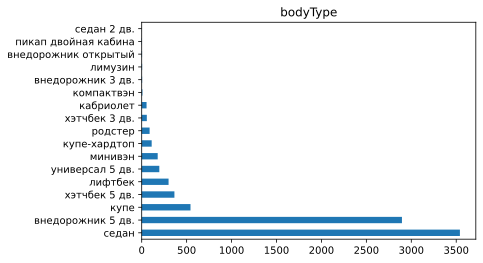

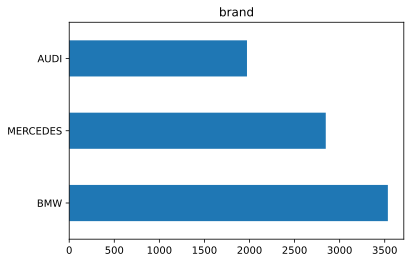

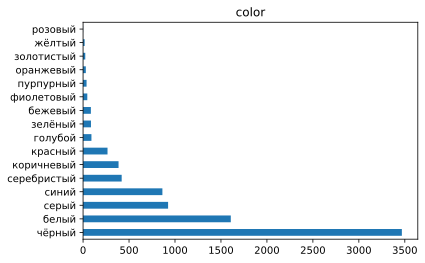

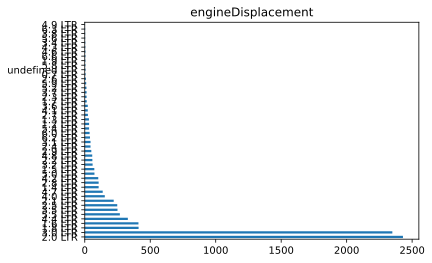

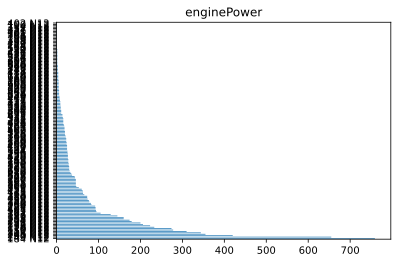

...

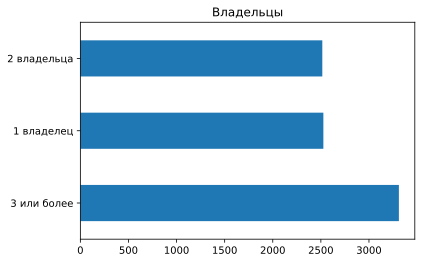

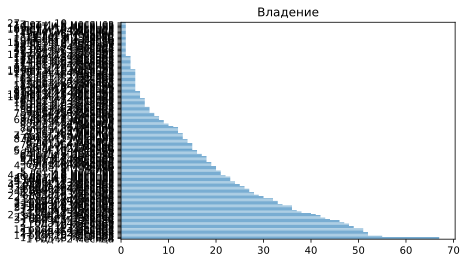

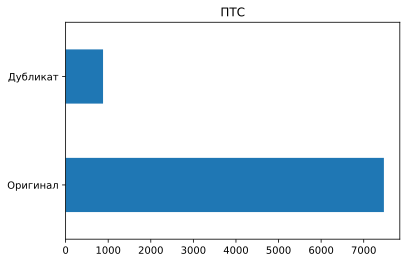

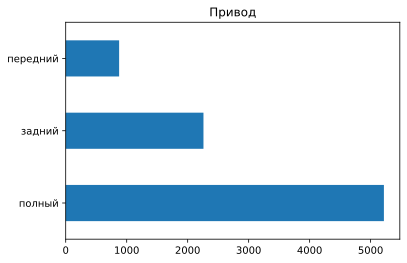

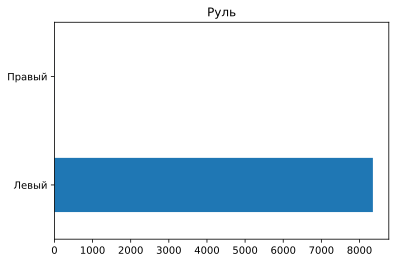

In [41]:
categorical_features = ['bodyType', 'brand', 'color', 'engineDisplacement', 'enginePower', 'fuelType', 'model_info', 'name',
  'numberOfDoors', 'vehicleTransmission', 'Владельцы', 'Владение', 'ПТС', 'Привод', 'Руль']
def visualize(categorical_features):
    for i in categorical_features:
        data[i].value_counts().plot.barh()
        plt.title(i)
        plt.show()

        
visualize(categorical_features)


In [42]:
data['engineDisplacement']

0       3.0 LTR
1       3.0 LTR
2       2.5 LTR
3       2.0 LTR
4       2.0 LTR
         ...   
8348    2.0 LTR
8349    2.0 LTR
8350    2.0 LTR
8351    3.0 LTR
8352    6.0 LTR
Name: engineDisplacement, Length: 8353, dtype: object

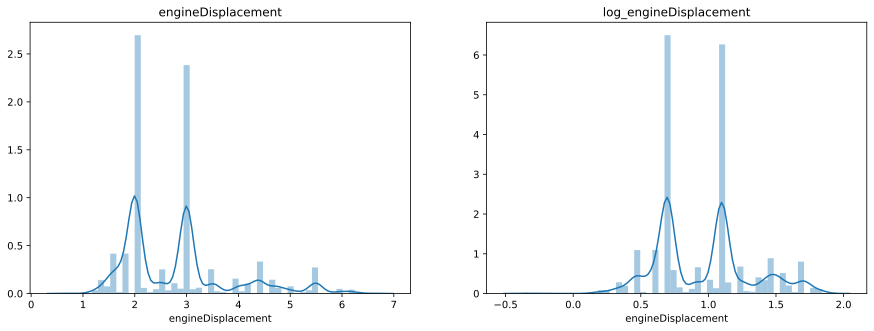

In [43]:
# Переведем признак engineDisplacement из категориального в числовой дополнительно взяв логарифм для более нормального распределения
s = data['engineDisplacement'].apply(lambda x: '2.0 LTR' if x == 'undefined LTR' else x)
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.title('engineDisplacement')
sns.distplot(s.apply(lambda x: float((x.split(' ')[0]))))
plt.subplot(1, 2, 2)
plt.title('log_engineDisplacement')
sns.distplot(np.log(s.apply(lambda x: float((x.split(' ')[0])))))


В моделях будем использовать признак engineDisplacement как числовой

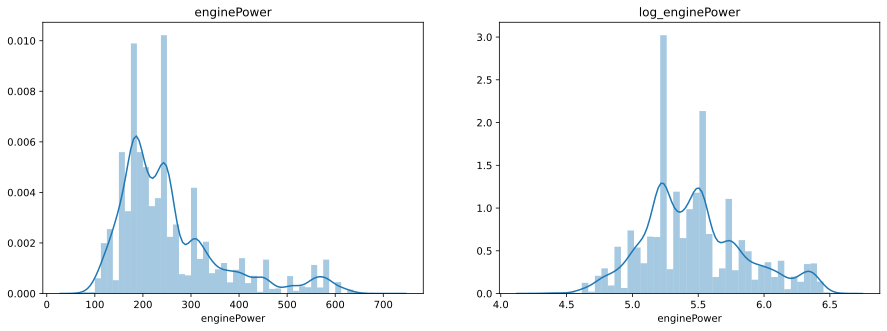

In [44]:
# Переведем признак enginePower из категориального в числовой дополнительно взяв логарифм для более нормального распределения
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.title('enginePower')
sns.distplot(data['enginePower'].str.split().apply(lambda x: int(x[0])))
plt.subplot(1, 2, 2)
plt.title('log_enginePower')
sns.distplot(np.log(data['enginePower'].str.split().apply(lambda x: int(x[0]))))

В моделях будем использовать признак enginePower как числовой

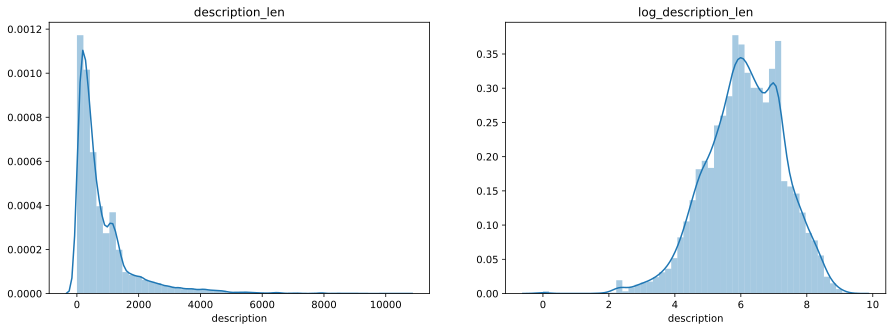

In [45]:
#создадим новый признак: длина текста
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.title('description_len')
sns.distplot(data['description'].apply(lambda x: len(x)))
plt.subplot(1, 2, 2)
plt.title('log_description_len')
sns.distplot(np.log(data['description'].apply(lambda x: len(x))))

Будем использовать данный признак как числовой логарифмованный признак

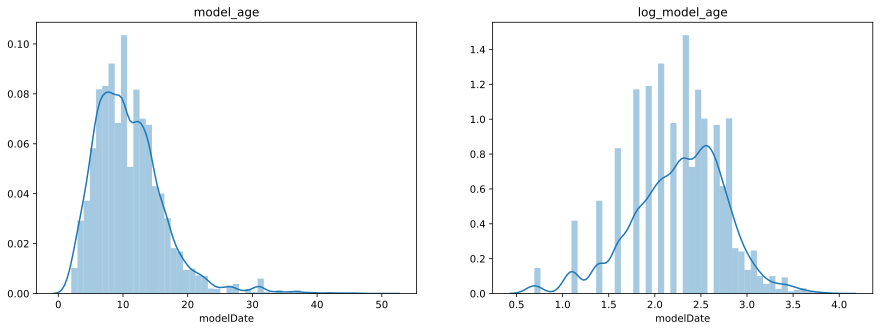

In [46]:
#добавим новый признак: дату модели
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.title('model_age')
sns.distplot(int(2021) - data['modelDate'].astype('int'))
plt.subplot(1, 2, 2)
plt.title('log_model_age')
sns.distplot(np.log(int(2021) - data['modelDate'].astype('int')))

у нового признака без логарифмирования распределение нормальное => будем использовать без логарифмирования

In [47]:
#data['name'] = data['name'].astype(str)
# Создадим новый категориальный признак transmission на базе данных из name (используем regex):
data['name'].str.extract('([A][T]|[M][T]|[A][M][T]|[C][V][T])',
                                                expand=False).str.strip().value_counts()

AT     6560
AMT    1201
CVT     406
MT      186
Name: name, dtype: int64

In [48]:
#добавим новый признак  4wd из данных колонки name
data['name'].apply(lambda x: 1 if '4WD' in x else 0).value_counts()

1    5218
0    3135
Name: name, dtype: int64

In [49]:
#добавим новый признак  xDrive из данных колонки name
data['name'].apply(lambda x: 1 if 'xDrive' in x else 0).value_counts()

0    7414
1     939
Name: name, dtype: int64

In [50]:
data.name

0                    300 3.0 AT (220 л.с.)
1       640d xDrive 3.0d AT (313 л.с.) 4WD
2              325xi 2.5 AT (218 л.с.) 4WD
3                   318i 2.0 AT (136 л.с.)
4       520d xDrive 2.0d AT (190 л.с.) 4WD
                       ...                
8348                320i 2.0 AT (150 л.с.)
8349               520d 2.0d AT (190 л.с.)
8350                318i 2.0 AT (143 л.с.)
8351            Long 3.0 AT (310 л.с.) 4WD
8352             Pullman 6.0 AT (394 л.с.)
Name: name, Length: 8353, dtype: object

In [51]:
data.model_info.unique()

array(['W124', '6ER', '3ER', '5ER', 'Q7', 'SL_KLASSE', 'A5', 'A4',
       'GL_KLASSE', 'A6', '1ER', 'X5', 'X3', 'S_KLASSE',
       'S_CLASS_MAYBACH', 'G_KLASSE', 'E_KLASSE', 'X7', 'Q5', 'A3',
       'B_KLASSE', '4', 'CLS_KLASSE_AMG', 'RS3', 'X6', 'C_KLASSE', 'X1',
       'S8', 'Q3', 'X6_M', '7ER', 'GLS_KLASSE', 'A7', 'GLC_KLASSE', 'TT',
       'Q8', 'M3', 'M4', 'C_KLASSE_AMG', 'X4', 'G_KLASSE_AMG', 'VITO',
       'M_KLASSE', 'CLA_KLASSE', 'TTS', 'GLK_KLASSE', 'SLK_KLASSE_AMG',
       'CLS_KLASSE', 'R_KLASSE', 'S_KLASSE_AMG', 'VIANO', 'GLE_KLASSE',
       'S5', 'AMG_GT', 'A8', 'M_KLASSE_AMG', 'A_KLASSE', 'M5', 'X5_M',
       'GLE_KLASSE_COUPE_AMG', 'ALLROAD', 'GLE_KLASSE_COUPE',
       'E_KLASSE_AMG', 'GLA_CLASS', 'SLS_AMG', 'AMG_GLC_COUPE',
       'V_KLASSE', 'GLE_KLASSE_AMG', 'X2', 'A4_ALLROAD', 'CL_KLASSE',
       'SLK_KLASSE', 'CLA_KLASSE_AMG', 'RS5', 'X_KLASSE', 'W123', 'A1',
       'S6', 'M6', 'M1', '2ER', '8ER', 'RS6', 'SL_KLASSE_AMG', 'S7', 'M2',
       'CL_KLASSE_AMG', 'Z4', 'X

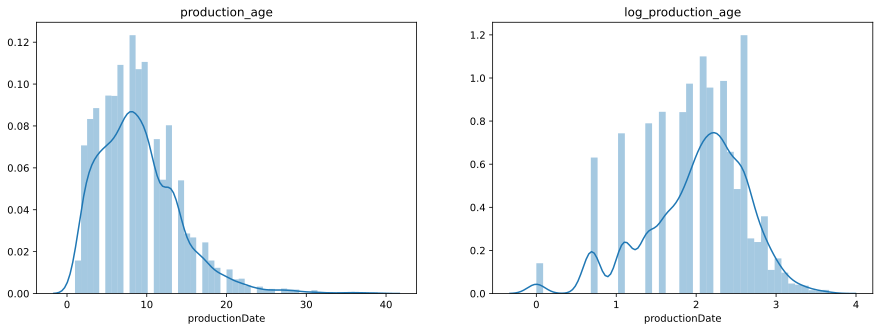

In [52]:
#добавим новый признак: дату производства
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.title('production_age')
sns.distplot(int(2021) - data['productionDate'].astype('int'))
plt.subplot(1, 2, 2)
plt.title('log_production_age')
sns.distplot(np.log(int(2021) - data['productionDate'].astype('int')))

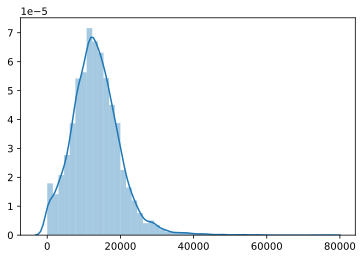

In [53]:
# Добавим признак - пробег в год
sns.distplot(data.mileage/(2021 - data['productionDate']))

у нового признака без логарифмирования распределение нормальное => будем использовать без логарифмирования

In [54]:
data['Владельцы'].unique()

array(['3 или более', '1\xa0владелец', '2\xa0владельца', nan],
      dtype=object)

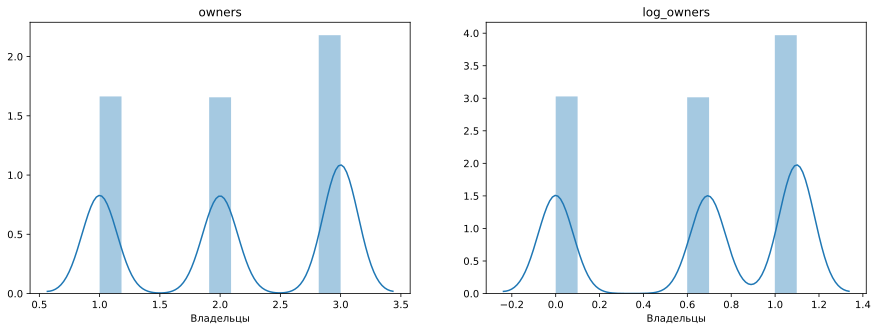

In [55]:
#преобразуем в числовой признак кол-во пользователей
owners = {'1\xa0владелец': 1, '2\xa0владельца': 2, '3 или более': 3}
plt.figure(figsize=(15, 5))
plt.subplot(1, 2, 1)
plt.title('owners')
sns.distplot(data['Владельцы'].apply(owners.get))
plt.subplot(1, 2, 2)
plt.title('log_owners')
sns.distplot(np.log(data['Владельцы'].apply(owners.get)))

In [56]:
data.description[2]

'Машина тут продаётся не в первый раз, НО! Только что:\n Перебран двигатель с заменой колец, колпаков, ванос, цепь, проклади и др.  \nПокрашена вся, кроме багажника и крыши (причина покраски - потёртости и сколы, не битая)\nСделаны работы по ходовой (рычаги, амортизаторы и др) \n\nПоменяно масло АКПП и Раздатка \n\nВырезаны катализаторы (немного рычит) \n\nКуча мелких работ, обновление прошивки. \n\nДля тех, кто не хочет вкладывать деньги! Общая стоимость  за эти работы составила больше 300 000 рублей.   Есть документы от сервиса. \n\nХорошая для этого года комплектация :  кожа, полный привод!, датчик дождя и света, помощь при спуске с горки. Установлена штатная медиасистема с экраном +камера заднего вида. \n\nМинусы : рычит на низах, после удаления катов( легко исправить, многим так больше нравится) \n\nОшибка по корректору фар (нужно поменять датчики, сами фары работают) \n\nМашина без подвоха! Идеальный внешний вид и прекрасное техническое состояние! \n\nТорг минимальный. \n'

In [57]:
#используем все текстовые признаки как категориальные без предобработки
categorical_features = ['bodyType', 'brand', 'color', 'engineDisplacement', 'enginePower', 'fuelType', 'model_info', 'name',
  'numberOfDoors', 'vehicleTransmission', 'Владельцы', 'Владение', 'ПТС', 'Привод', 'Руль']
#используем все числовые признаки
numerical_features = ['mileage', 'modelDate', 'productionDate']
bin_features = []
def preproc_data(df_input):
    '''includes several functions to pre-process the predictor data.'''
      
    df_output = df_input.copy()
    
    # ################### 1. Предобработка ############################################################## 
    # добавляем новые признаки
    
    df_output['гараж'] = df_output.description.apply(lambda x: 1 if 'гараж' in x else 0)
    bin_features.append('гараж')
    df_output['подарок'] = df_output.description.apply(lambda x: 1 if 'подарок' in x else 0)
    bin_features.append('подарок')
    df_output['торг'] = df_output.description.apply(lambda x: 1 if 'торг' in x else 0)
    bin_features.append('торг')
    df_output['шины'] = df_output.description.apply(lambda x: 1 if ('шин' in x) or ('резин' in x)  or ('колес' in x) else 0)
    bin_features.append('шины')
    df_output['собственник'] = df_output.description.apply(lambda x: 1 if 'собственник' in x else 0)
    bin_features.append('собственник')
    df_output['подогрев'] = df_output.description.apply(lambda x: 1 if 'подогрев' in x else 0)
    bin_features.append('подогрев')
    df_output['обмен'] = df_output.description.apply(lambda x: 1 if 'обмен' in x else 0)
    bin_features.append('обмен')
    df_output['обслуж'] = df_output.description.apply(lambda x: 1 if 'обслуж' in x else 0)
    bin_features.append('обслуж')
    df_output['срочн'] = df_output.description.apply(lambda x: 1 if 'срочн' in x else 0)
    bin_features.append('срочн')
    df_output['скидк'] = df_output.description.apply(lambda x: 1 if 'скидк' in x else 0)
    bin_features.append('скидк')
    df_output['диск'] = df_output.description.apply(lambda x: 1 if 'диск' in x else 0)
    bin_features.append('диск')
    df_output['авария'] = df_output.description.apply(lambda x: 1 if 'авари' in x else 0)
    bin_features.append('авария')
    
    
    
    #создадим новый признак: длина текста
    df_output['description_len'] = np.log(df_output['description'].apply(lambda x: len(x)))
    numerical_features.append('description_len') 
    
    # Переведем признак engineDisplacement из категориального в числовой дополнительно взяв логарифм для более нормального распределения
    df_output['engineDisplacement'] = df_output['engineDisplacement'].apply(lambda x: '2.0 LTR' if x == 'undefined LTR' else x)
    df_output['engineDisplacement'] = np.log(df_output['engineDisplacement'].apply(lambda x: float((x.split(' ')[0]))))
    numerical_features.append('engineDisplacement')
    categorical_features.remove('engineDisplacement')
    
    # Переведем признак enginePower из категориального в числовой дополнительно взяв логарифм для более нормального распределения
    df_output['enginePower'] = np.log(df_output['enginePower'].str.split().apply(lambda x: int(x[0])))
    numerical_features.append('enginePower')
    categorical_features.remove('enginePower')
    
    #добавим новый признак: возраст модели
    df_output['model_age'] = int(2021) - data['modelDate'].astype('int')
    numerical_features.append('model_age')
    numerical_features.remove('modelDate')
    
    # Создадим новый категориальный признак transmission на базе данных из name (используем regex):
    df_output['transmission'] = df_output['name'].str.extract('([A][T]|[M][T]|[A][M][T]|[C][V][T])',
                                                expand=False).str.strip()
    categorical_features.append('transmission')
    
    #добавим новый признак  4wd из данных колонки name
    df_output['4WD'] = df_output['name'].apply(lambda x: 1 if '4WD' in x else 0)
    bin_features.append('4WD')
    
    #добавим новый признак  xDrive из данных колонки name
    df_output['xDrive']=df_output['name'].apply(lambda x: 1 if 'xDrive' in x else 0)
    bin_features.append('xDrive')
    
    #добавим новый признак: дату производства
    df_output['production_age']= int(2021) - df_output['productionDate'].astype('int')
    numerical_features.append('production_age')
    numerical_features.remove('productionDate')
    
    # Добавим признак - пробег в год
    df_output['mileage_mean'] = df_output.mileage/(2021 - data['productionDate'])
    numerical_features.append('mileage_mean')
    
    # Создадим признак - разница между созданием модели и выпуском автомобиля
    df_output['Y_no_sale'] = data.productionDate - data.modelDate
    numerical_features.append('Y_no_sale')
    
    df_output['hard_usage'] = df_output['mileage_mean'].apply(lambda x: 1 if x >=20000 else 0)
    bin_features.append('hard_usage')
    
    df_output['trash'] = df_output.mileage.apply(lambda x: 1 if x>=300000 else 0)
    bin_features.append('trash')
    
    #преобразуем в числовой признак кол-во пользователей
    owners = {'1\xa0владелец': 1, '2\xa0владельца': 2, '3 или более': 3}
    df_output['owners']= df_output['Владельцы'].apply(owners.get)
    numerical_features.append('owners')
    
    years = df_output['Владение'].str.extract(
        '(\d*) (го|ле)')[0].fillna(0).astype(int)
    months = df_output['Владение'].str.extract('(\d*) (ме)')[0].fillna(0).astype(int)
    df_output['months_ownership'] = years * 12 + months
    numerical_features.append('months_ownership')
    categorical_features.remove('Владение')
    
    # убираем не нужные для модели признаки
    categorical_features.remove('name')
    df_output.drop(['description','sell_id','name', 'Владение', 'productionDate','modelDate'], axis = 1, inplace=True)
    
    #Логарифмируем целевую переменную для придачи ей нормального распределения. 
    #df_output.price = df_output.price.apply(lambda x: np.log(x) if x !=0 else 0)
    
    # ################### Numerical Features ############################################################## 
    # Далее заполняем пропуски
    for column in numerical_features:
        df_output[column].fillna(df_output[column].median(), inplace=True)
    # тут ваш код по обработке NAN
    # ....
    
    # Нормализация данных
    scaler = MinMaxScaler()
    for column in numerical_features:
        df_output[column] = scaler.fit_transform(df_output[[column]])[:,0]
    
#     scaler = StandardScaler()
#     for column in numerical_features:
#         df_output[column] = scaler.fit_transform(df_output[[column]])[:,0]
        
#   scaler = RobustScaler()
#    for column in numerical_features:
#   df_output[column] = scaler.fit_transform(df_output[[column]])[:,0]  
    
    # ################### Categorical Features ############################################################## 
    # Label Encoding
    for column in categorical_features:
        df_output[column] = df_output[column].astype('category').cat.codes
        
    # One-Hot Encoding: в pandas есть готовая функция - get_dummies.
    df_output = pd.get_dummies(df_output, columns=categorical_features, dummy_na=False)
    # тут ваш код не Encoding фитчей
    # ....
    
    
    # ################### Feature Engineering ####################################################
    # тут ваш код не генерацию новых фитчей
    # ....
    
    
    # ################### Clean #################################################### 
    # убираем признаки которые еще не успели обработать, 
    df_output.drop(['vehicleConfiguration'], axis = 1, inplace=True)
    
    return df_output

In [58]:
# Запускаем и проверяем, что получилось
df_preproc = preproc_data(data)
df_preproc.sample(10)

,engineDisplacement,enginePower,mileage,sample,price,гараж,подарок,торг,шины,собственник,...,ПТС_1,Привод_0,Привод_1,Привод_2,Руль_0,Руль_1,transmission_0,transmission_1,transmission_2,transmission_3
7399,0.467888,0.529985,0.106999,1,1590000.0,0,0,0,1,0,...,1,0,0,1,1,0,0,1,0,0
4273,0.467888,0.529985,0.044999,1,3100000.0,0,0,0,1,0,...,1,0,0,1,1,0,0,1,0,0
3362,0.918742,0.919650,0.054999,1,3750000.0,0,0,0,0,0,...,1,0,0,1,1,0,0,1,0,0
2794,0.648598,0.529985,0.124999,1,1990000.0,0,0,0,1,1,...,1,0,0,1,1,0,1,0,0,0
5378,0.467888,0.477709,0.148999,1,1285000.0,0,0,1,0,0,...,1,0,0,1,1,0,0,1,0,0
5902,0.776813,0.900097,0.069799,1,3399999.0,0,0,0,0,0,...,1,0,0,1,1,0,0,1,0,0
1454,0.648598,0.649551,0.052765,0,0.0,0,0,0,0,0,...,1,0,0,1,1,0,0,1,0,0
2476,0.567340,0.477709,0.173499,1,700000.0,0,0,0,1,0,...,0,1,0,0,1,0,0,1,0,0
743,0.368437,0.191371,0.119999,0,0.0,0,0,0,1,0,...,1,1,0,0,1,0,0,1,0,0
1168,0.918742,0.887119,0.035999,0,0.0,0,0,0,1,0,...,1,0,0,1,1,0,0,1,0,0


In [59]:
df_preproc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8353 entries, 0 to 8352
Columns: 213 entries, engineDisplacement to transmission_3
dtypes: float64(11), int64(17), uint8(185)
memory usage: 3.3 MB


In [60]:
bin_features

['гараж',
 'подарок',
 'торг',
 'шины',
 'собственник',
 'подогрев',
 'обмен',
 'обслуж',
 'срочн',
 'скидк',
 'диск',
 'авария',
 '4WD',
 'xDrive',
 'hard_usage',
 'trash']

In [61]:
numerical_features

['mileage',
 'description_len',
 'engineDisplacement',
 'enginePower',
 'model_age',
 'production_age',
 'mileage_mean',
 'Y_no_sale',
 'owners',
 'months_ownership']

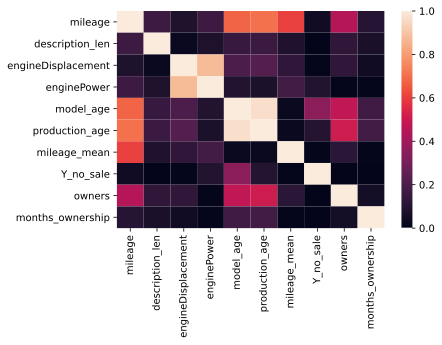

In [62]:
sns.heatmap(df_preproc[numerical_features].corr().abs(), vmin=0, vmax=1)

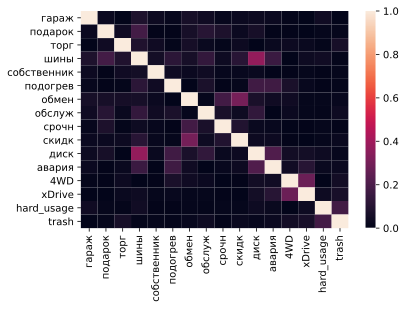

In [63]:
sns.heatmap(df_preproc[bin_features].corr().abs(), vmin=0, vmax=1)

In [64]:
sns.heatmap(df_preproc.corr().abs(), vmin=0, vmax=1)

## Split data

In [65]:
# Теперь выделим тестовую часть
train_data = df_preproc.query('sample == 1').drop(['sample'], axis=1)
test_data = df_preproc.query('sample == 0').drop(['sample'], axis=1)

y = train_data.price.values     # наш таргет
X = train_data.drop(['price'], axis=1)
X_sub = test_data.drop(['price'], axis=1)

In [66]:
test_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1671 entries, 0 to 1670
Columns: 212 entries, engineDisplacement to transmission_3
dtypes: float64(11), int64(16), uint8(185)
memory usage: 667.4 KB


# Model 2: CatBoostRegressor

In [67]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, shuffle=True, random_state=RANDOM_SEED)

In [68]:
model = CatBoostRegressor(iterations = 5000,
                          depth=10,
                          learning_rate = 0.01,
                          random_seed = RANDOM_SEED,
                          eval_metric='MAPE',
                          custom_metric=['RMSE', 'MAE'],
                          od_wait=500,
                          #task_type='GPU',
                         )
model.fit(X_train, y_train,
         eval_set=(X_test, y_test),
         verbose_eval=100,
         use_best_model=True,
         #plot=True
         )

0:	learn: 0.9968022	test: 1.0213137	best: 1.0213137 (0)	total: 90.1ms	remaining: 7m 30s
100:	learn: 0.4834471	test: 0.4940996	best: 0.4940996 (100)	total: 2.26s	remaining: 1m 49s
200:	learn: 0.2912426	test: 0.2996385	best: 0.2996385 (200)	total: 4.47s	remaining: 1m 46s
300:	learn: 0.2172677	test: 0.2271010	best: 0.2270386 (299)	total: 6.66s	remaining: 1m 44s
400:	learn: 0.1951192	test: 0.2056140	best: 0.2056140 (400)	total: 8.76s	remaining: 1m 40s
500:	learn: 0.1823282	test: 0.1939437	best: 0.1939437 (500)	total: 10.8s	remaining: 1m 37s
600:	learn: 0.1713263	test: 0.1843835	best: 0.1843835 (600)	total: 12.9s	remaining: 1m 34s
700:	learn: 0.1607960	test: 0.1756118	best: 0.1756118 (700)	total: 15s	remaining: 1m 32s
800:	learn: 0.1535257	test: 0.1696947	best: 0.1696843 (799)	total: 17.2s	remaining: 1m 30s
900:	learn: 0.1486307	test: 0.1657941	best: 0.1657941 (900)	total: 19.4s	remaining: 1m 28s
1000:	learn: 0.1437042	test: 0.1620758	best: 0.1620758 (1000)	total: 21.6s	remaining: 1m 26s
11

In [69]:
test_predict_catboost = model.predict(X_test)
print(f"TEST mape: {(mape(y_test, test_predict_catboost))*100:0.2f}%")

TEST mape: 12.68%


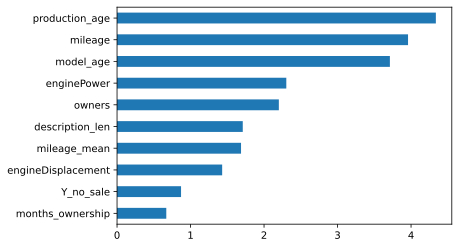

In [70]:
# проверяем значимость переменных
from sklearn.feature_selection import f_classif, mutual_info_classif
imp_num = pd.Series(f_classif(df_preproc[numerical_features],
                              df_preproc['price'])[0], index=numerical_features)
imp_num.sort_values(inplace=True)
imp_num.plot(kind='barh')

### Submission

In [71]:
X_sub

,engineDisplacement,enginePower,mileage,гараж,подарок,торг,шины,собственник,подогрев,обмен,...,ПТС_1,Привод_0,Привод_1,Привод_2,Руль_0,Руль_1,transmission_0,transmission_1,transmission_2,transmission_3
0,0.648598,0.481798,0.349999,0,0,0,1,0,1,0,...,1,1,0,0,1,0,0,1,0,0
1,0.648598,0.639649,0.014999,0,0,0,1,0,0,0,...,1,0,0,1,1,0,0,1,0,0
2,0.567340,0.477709,0.166599,0,0,0,1,0,0,0,...,1,0,0,1,1,0,0,1,0,0
3,0.467888,0.266462,0.146999,0,0,0,0,0,0,0,...,1,1,0,0,1,0,0,1,0,0
4,0.467888,0.416162,0.023999,1,0,0,1,0,0,0,...,1,0,0,1,1,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1666,0.467888,0.401796,0.075999,0,0,1,1,0,0,0,...,1,1,0,0,1,0,0,1,0,0
1667,0.648598,0.477709,0.120380,0,0,0,1,0,0,0,...,1,0,0,1,1,0,0,1,0,0
1668,0.308924,0.310328,0.025789,0,0,0,1,0,0,0,...,1,0,1,0,1,0,1,0,0,0
1669,0.467888,0.401796,0.103999,0,0,0,1,0,0,0,...,1,1,0,0,1,0,0,1,0,0


In [72]:
sub_predict_catboost = model.predict(X_sub)
sample_submission['price'] = sub_predict_catboost
sample_submission.to_csv('catboost_submission.csv', index=False)

# Model 3: Tabular NN

Построим обычную сеть:

In [73]:
X_train.head(5)

,engineDisplacement,enginePower,mileage,гараж,подарок,торг,шины,собственник,подогрев,обмен,...,ПТС_1,Привод_0,Привод_1,Привод_2,Руль_0,Руль_1,transmission_0,transmission_1,transmission_2,transmission_3
7320,0.957522,0.887119,0.149999,0,0,0,0,0,0,0,...,1,1,0,0,1,0,0,1,0,0
8037,0.467888,0.529985,0.020941,0,0,0,1,0,0,0,...,1,0,0,1,1,0,0,1,0,0
4681,0.663211,0.547896,0.133896,0,0,0,0,0,0,1,...,1,0,0,1,1,0,0,1,0,0
6014,0.420931,0.401796,0.329999,0,0,0,0,0,0,0,...,1,1,0,0,1,0,0,1,0,0
3649,0.648598,0.639649,0.125999,0,0,0,0,0,0,0,...,1,0,0,1,1,0,0,1,0,0


## Simple Dense NN

In [74]:
model = Sequential()
model.add(L.Dense(512, input_dim=X_train.shape[1], activation="relu"))
model.add(L.Dropout(0.5))
model.add(L.Dense(256, activation="relu"))
model.add(L.Dropout(0.5))
model.add(L.Dense(1, activation="linear"))

In [75]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 512)               108544    
_________________________________________________________________
dropout (Dropout)            (None, 512)               0         
_________________________________________________________________
dense_1 (Dense)              (None, 256)               131328    
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 257       
Total params: 240,129
Trainable params: 240,129
Non-trainable params: 0
_________________________________________________________________


In [76]:
# Compile model
optimizer = tf.keras.optimizers.Adam(0.01)
model.compile(loss='MAPE',optimizer=optimizer, metrics=['MAPE'])

In [77]:
checkpoint = ModelCheckpoint('../working/best_model.hdf5' , monitor=['val_MAPE'], verbose=0  , mode='min')
earlystop = EarlyStopping(monitor='val_MAPE', patience=50, restore_best_weights=True,)
callbacks_list = [checkpoint, earlystop]

In [78]:
X_test

,engineDisplacement,enginePower,mileage,гараж,подарок,торг,шины,собственник,подогрев,обмен,...,ПТС_1,Привод_0,Привод_1,Привод_2,Руль_0,Руль_1,transmission_0,transmission_1,transmission_2,transmission_3
5951,0.467888,0.266462,0.241250,0,0,0,0,0,0,0,...,1,1,0,0,1,0,0,1,0,0
7646,0.420931,0.210425,0.054999,0,0,0,0,0,0,0,...,1,0,1,0,1,0,0,0,1,0
3123,0.467888,0.491859,0.140134,0,1,0,1,0,0,0,...,1,0,0,1,1,0,0,1,0,0
7597,0.549146,0.384431,0.235999,0,0,0,1,0,0,0,...,1,0,1,0,1,0,0,0,1,0
7740,0.368437,0.327888,0.057901,0,0,0,0,0,0,1,...,1,0,1,0,1,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8134,0.467888,0.432360,0.017491,0,0,0,1,0,1,0,...,1,0,0,1,1,0,0,1,0,0
4102,0.467888,0.491859,0.104999,0,0,0,0,0,0,0,...,1,0,0,1,1,0,1,0,0,0
5020,0.648598,0.489865,0.299999,0,0,0,1,0,0,0,...,1,0,0,1,1,0,0,1,0,0
2535,0.467888,0.529985,0.123999,0,0,0,0,0,0,0,...,1,1,0,0,1,0,0,1,0,0


### Fit

In [79]:
history = model.fit(X_train, y_train,
                    batch_size=512,
                    epochs=500, # фактически мы обучаем пока EarlyStopping не остановит обучение
                    validation_data=(X_test, y_test),
                    callbacks=callbacks_list,
                    verbose=0,
                   )

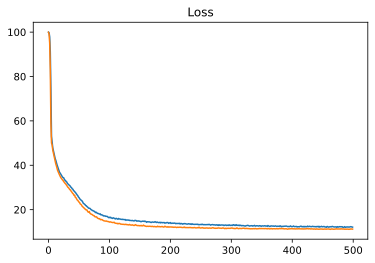

In [80]:
plt.title('Loss')
plt.plot(history.history['MAPE'], label='train')
plt.plot(history.history['val_MAPE'], label='test')
plt.show();

In [81]:
model.load_weights('../working/best_model.hdf5')
model.save('../working/nn_1.hdf5')

In [82]:
test_predict_nn1 = model.predict(X_test)
print(f"TEST mape: {(mape(y_test, test_predict_nn1[:,0]))*100:0.2f}%")

TEST mape: 11.23%


In [83]:
sub_predict_nn1 = model.predict(X_sub)
sample_submission['price'] = sub_predict_nn1[:,0]
sample_submission.to_csv('nn1_submission.csv', index=False)

Рекомендации для улучшения Model 3:    
* В нейросеть желательно подавать данные с распределением, близким к нормальному, поэтому от некоторых числовых признаков имеет смысл взять логарифм перед нормализацией. Пример:
`modelDateNorm = np.log(2020 - data['modelDate'])`
Статья по теме: https://habr.com/ru/company/ods/blog/325422

* Извлечение числовых значений из текста:
Парсинг признаков 'engineDisplacement', 'enginePower', 'Владение' для извлечения числовых значений.

* Cокращение размерности категориальных признаков
Признак name 'name' содержит данные, которые уже есть в других столбцах ('enginePower', 'engineDisplacement', 'vehicleTransmission'), поэтому эти данные можно удалить. Затем следует еще сильнее сократить размерность, например, выделив наличие xDrive в качестве отдельного признака.

# Model 4: NLP + Multiple Inputs

In [84]:
rubbish = "[A-Za-z!#$%№&'()*+,./:;<=>?@\[\]^_`{|}~—\"\-+●•✅☑️☛\n]"
numbers = '\d+'
data['description'] = data.description.apply(lambda x: re.sub('\s+', ' ',re.sub(numbers, '',re.sub(rubbish, ' ', x)).lower()))

In [85]:
lemmer = WordNetLemmatizer()
stemmer = RussianStemmer()
tokenizer = RegexpTokenizer(r'\w+')
def process_words(text):
    tokens = tokenizer.tokenize(text)  
    filtered_words = [word for word in tokens 
                      if len(word) > 2 
                      if word not in stopwords.words('russian')]
    stem_words=[stemmer.stem(word) for word in filtered_words]
    lemma_words=[lemmer.lemmatize(word) for word in stem_words]
    result = " ".join(word for word in lemma_words)
    return result

In [86]:
data['description'] = data['description'].apply(process_words)

In [87]:
data.description

0       всем привет прод эксклюзивн проект универса мо...
1       прода любим тачил обвес тюнинг езж должн резв ...
2       машин прода перв перебра двигател замен колец ...
3       автомобил отличн состоян ве родн краск крас ба...
4       немк бесключив доступ камер задн вид автомобил...
                              ...                        
8348    прода любим автомобил год эксплуатац машин вел...
8349    купл официальн дилер трет владелец владельц фи...
8350    торг мест работа сборк немецк резин летн нов д...
8351    автомобил отличн состоян авт сем обслуживан пр...
8352    удлинен заводск баз вообщ правильн заводск инд...
Name: description, Length: 8353, dtype: object

In [88]:
# TOKENIZER
# The maximum number of words to be used. (most frequent)
MAX_WORDS = 100000
# Max number of words in each complaint.
MAX_SEQUENCE_LENGTH = 256

In [89]:
# split данных
text_train = data.description.iloc[X_train.index]
text_test = data.description.iloc[X_test.index]
text_sub = data.description.iloc[X_sub.index]

### Tokenizer

In [90]:
%%time
tokenize = Tokenizer(num_words=MAX_WORDS)
tokenize.fit_on_texts(data.description)

CPU times: user 944 ms, sys: 3.65 ms, total: 948 ms
Wall time: 950 ms


In [91]:
tokenize.word_index

{'автомобил': 1,
 'систем': 2,
 'пробег': 3,
 'задн': 4,
 'салон': 5,
 'сиден': 6,
 'состоян': 7,
 'передн': 8,
 'машин': 9,
 'диск': 10,
 'комплект': 11,
 'дилер': 12,
 'год': 13,
 'официальн': 14,
 'нов': 15,
 'ваш': 16,
 'фар': 17,
 'авт': 18,
 'рул': 19,
 'безопасн': 20,
 'гарант': 21,
 'пакет': 22,
 'колес': 23,
 'комплектац': 24,
 'лет': 25,
 'контрол': 26,
 'птс': 27,
 'проверк': 28,
 'зерка': 29,
 'покупк': 30,
 'продаж': 31,
 'водител': 32,
 'полн': 33,
 'отличн': 34,
 'автомоб': 35,
 'техническ': 36,
 'шин': 37,
 'датчик': 38,
 'прода': 39,
 'пассажир': 40,
 'двигател': 41,
 'резин': 42,
 'услов': 43,
 'ключ': 44,
 'юридическ': 45,
 'кред': 46,
 'люб': 47,
 'подушк': 48,
 'обслуживан': 49,
 'торг': 50,
 'оригина': 51,
 'дополнительн': 52,
 'обогр': 53,
 'двер': 54,
 'масл': 55,
 'черн': 56,
 'стекл': 57,
 'рулев': 58,
 'возможн': 59,
 'электропривод': 60,
 'оригинальн': 61,
 'наш': 62,
 'климат': 63,
 'подогр': 64,
 'кож': 65,
 'сервисн': 66,
 'функц': 67,
 'дтп': 68,
 'автом

In [92]:
%%time
text_train_sequences = sequence.pad_sequences(tokenize.texts_to_sequences(text_train), maxlen=MAX_SEQUENCE_LENGTH)
text_test_sequences = sequence.pad_sequences(tokenize.texts_to_sequences(text_test), maxlen=MAX_SEQUENCE_LENGTH)
text_sub_sequences = sequence.pad_sequences(tokenize.texts_to_sequences(text_sub), maxlen=MAX_SEQUENCE_LENGTH)

print(text_train_sequences.shape, text_test_sequences.shape, text_sub_sequences.shape, )

(5679, 256) (1003, 256) (1671, 256)
CPU times: user 894 ms, sys: 736 µs, total: 895 ms
Wall time: 895 ms


In [93]:
# вот так теперь выглядит наш текст
print(text_train.iloc[6])
print(text_train_sequences[6])

автомобил провер пункт автокред специальн ставк ауд центр север официальн дилер входя групп компан рольф явля одн крупн дилер европ предлага ряд услуг покупк продаж автомобил пробег протяжен мног лет наш дилерск центр явля лидер продаж автомобил пробег сред дилер росс предоставля клиент сам больш выбор автомобил пробег друг марок кажд автомобил проход тщательн диагностик подготовк гарантирова наход отличн состоян убед правильн выбор возможн пройт тест драйв ознакомительн поездк интерес автомобил сможет ознаком автомобил выход дом наш менеджер проведет презентац видеозвонк покажет выбра автомобил такж ауд центр север представля уникальн предложен кредитован автомобил пробег индивидуальн услов специалист компан подберут лучш услов кредитован проверен автомобил пробег гарант лет ждут сайт мобильн приложен рольф
[   0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0    0    0    0
    0    0    0    0    0    0    0   

### RNN NLP

In [94]:
model_nlp = Sequential()
model_nlp.add(L.Input(shape=MAX_SEQUENCE_LENGTH, name="seq_description"))
model_nlp.add(L.Embedding(len(tokenize.word_index)+1, MAX_SEQUENCE_LENGTH,))
model_nlp.add(L.LSTM(256, return_sequences=True))
model_nlp.add(L.Dropout(0.5))
model_nlp.add(L.LSTM(128,))
model_nlp.add(L.Dropout(0.25))
model_nlp.add(L.Dense(64, activation="relu"))
model_nlp.add(L.Dropout(0.25))

### MLP

In [95]:
model_mlp = Sequential()
model_mlp.add(L.Dense(512, input_dim=X_train.shape[1], activation="relu"))
model_mlp.add(L.Dropout(0.5))
model_mlp.add(L.Dense(256, activation="relu"))
model_mlp.add(L.Dropout(0.5))

### Multiple Inputs NN

In [96]:
combinedInput = L.concatenate([model_nlp.output, model_mlp.output])
# being our regression head
head = L.Dense(64, activation="relu")(combinedInput)
head = L.Dense(1, activation="linear")(head)

model = Model(inputs=[model_nlp.input, model_mlp.input], outputs=head)

In [97]:
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
seq_description (InputLayer)    [(None, 256)]        0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 256, 256)     3192320     seq_description[0][0]            
__________________________________________________________________________________________________
lstm (LSTM)                     (None, 256, 256)     525312      embedding[0][0]                  
__________________________________________________________________________________________________
dropout_2 (Dropout)             (None, 256, 256)     0           lstm[0][0]                       
_______________________________________________________________________________________

### Fit

In [98]:
optimizer = tf.keras.optimizers.Adam(0.01)
model.compile(loss='MAPE',optimizer=optimizer, metrics=['MAPE'])

In [99]:
checkpoint = ModelCheckpoint('../working/best_model.hdf5', monitor=['val_MAPE'], verbose=0, mode='min')
earlystop = EarlyStopping(monitor='val_MAPE', patience=10, restore_best_weights=True,)
callbacks_list = [checkpoint, earlystop]

In [100]:
history = model.fit([text_train_sequences, X_train], y_train,
                    batch_size=512,
                    epochs=500, # фактически мы обучаем пока EarlyStopping не остановит обучение
                    validation_data=([text_test_sequences, X_test], y_test),
                    callbacks=callbacks_list
                   )

Epoch 1/500
12/12 [==============================] - 73s 6s/step - loss: 99.9901 - MAPE: 99.9901 - val_loss: 99.8727 - val_MAPE: 99.8727
Epoch 2/500
12/12 [==============================] - 73s 6s/step - loss: 98.7185 - MAPE: 98.7185 - val_loss: 93.9542 - val_MAPE: 93.9542
Epoch 3/500
12/12 [==============================] - 73s 6s/step - loss: 79.4395 - MAPE: 79.4395 - val_loss: 51.1718 - val_MAPE: 51.1718
Epoch 4/500
12/12 [==============================] - 72s 6s/step - loss: 52.9786 - MAPE: 52.9786 - val_loss: 48.2281 - val_MAPE: 48.2281
Epoch 5/500
12/12 [==============================] - 73s 6s/step - loss: 47.3632 - MAPE: 47.3632 - val_loss: 45.2014 - val_MAPE: 45.2014
Epoch 6/500
12/12 [==============================] - 72s 6s/step - loss: 44.6526 - MAPE: 44.6526 - val_loss: 42.1625 - val_MAPE: 42.1625
Epoch 7/500
12/12 [==============================] - 73s 6s/step - loss: 41.9332 - MAPE: 41.9332 - val_loss: 39.4933 - val_MAPE: 39.4933
Epoch 8/500
12/12 [======================

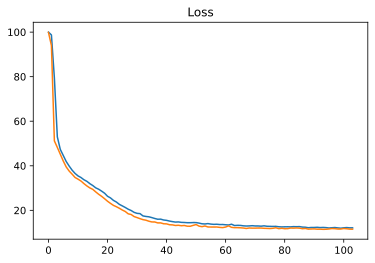

In [101]:
plt.title('Loss')
plt.plot(history.history['MAPE'], label='train')
plt.plot(history.history['val_MAPE'], label='test')
plt.show();

In [102]:
model.load_weights('../working/best_model.hdf5')
model.save('../working/nn_mlp_nlp.hdf5')

In [103]:
test_predict_nn2 = model.predict([text_test_sequences, X_test])
print(f"TEST mape: {(mape(y_test, test_predict_nn2[:,0]))*100:0.2f}%")

TEST mape: 11.53%


In [104]:
sub_predict_nn2 = model.predict([text_sub_sequences, X_sub])
sample_submission['price'] = sub_predict_nn2[:,0]
sample_submission.to_csv('nn2_submission.csv', index=False)

Идеи для улучшения NLP части:
* Выделить из описаний часто встречающиеся блоки текста, заменив их на кодовые слова или удалив
* Сделать предобработку текста, например, сделать лемматизацию - алгоритм ставящий все слова в форму по умолчанию (глаголы в инфинитив и т. д.), чтобы токенайзер не преобразовывал разные формы слова в разные числа
Статья по теме: https://habr.com/ru/company/Voximplant/blog/446738/
* Поработать над алгоритмами очистки и аугментации текста

# Model 5: Добавляем картинки

### Data

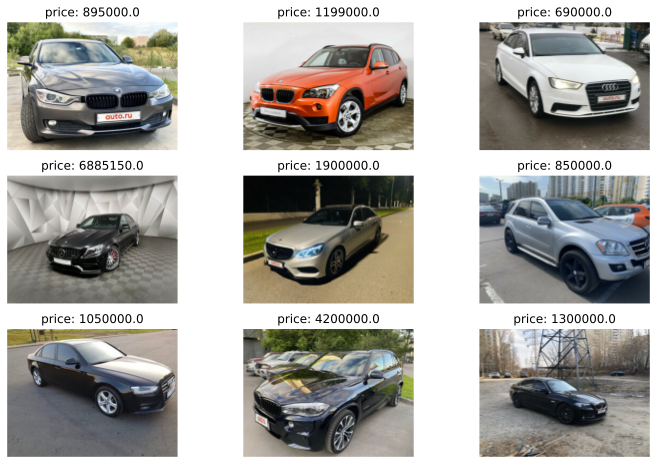

In [105]:
# убедимся, что цены и фото подгрузились верно
plt.figure(figsize = (12,8))

random_image = train.sample(n = 9)
random_image_paths = random_image['sell_id'].values
random_image_cat = random_image['price'].values

for index, path in enumerate(random_image_paths):
    im = PIL.Image.open(DATA_DIR+'img/img/' + str(path) + '.jpg')
    plt.subplot(3, 3, index + 1)
    plt.imshow(im)
    plt.title('price: ' + str(random_image_cat[index]))
    plt.axis('off')
plt.show()

In [106]:
size = (320, 240)

def get_image_array(index):
    images_train = []
    for index, sell_id in enumerate(data['sell_id'].iloc[index].values):
        image = cv2.imread(DATA_DIR + 'img/img/' + str(sell_id) + '.jpg')
        assert(image is not None)
        image = cv2.resize(image, size)
        images_train.append(image)
    images_train = np.array(images_train)
    print('images shape', images_train.shape, 'dtype', images_train.dtype)
    return(images_train)

images_train = get_image_array(X_train.index)
images_test = get_image_array(X_test.index)
images_sub = get_image_array(X_sub.index)

images shape (5679, 240, 320, 3) dtype uint8
images shape (1003, 240, 320, 3) dtype uint8
images shape (1671, 240, 320, 3) dtype uint8


### albumentations

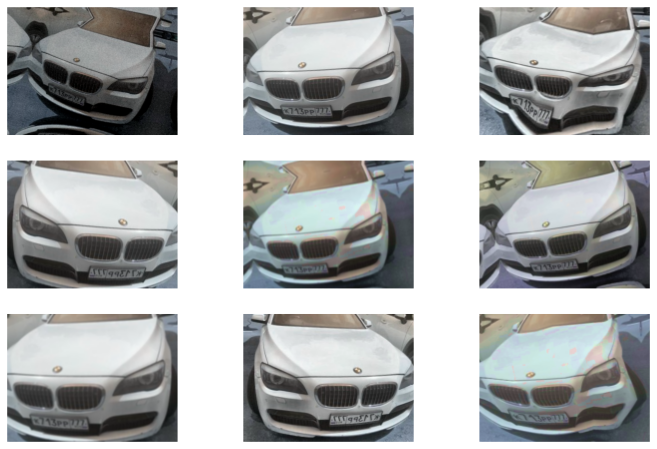

In [107]:
from albumentations import (
    HorizontalFlip, IAAPerspective, ShiftScaleRotate, CLAHE, RandomRotate90,
    Transpose, ShiftScaleRotate, Blur, OpticalDistortion, GridDistortion, HueSaturationValue,
    IAAAdditiveGaussianNoise, GaussNoise, MotionBlur, MedianBlur, IAAPiecewiseAffine,
    IAASharpen, IAAEmboss, RandomBrightnessContrast, Flip, OneOf, Compose
)


#пример взят из официальной документации: https://albumentations.readthedocs.io/en/latest/examples.html
augmentation = Compose([
    HorizontalFlip(),
    OneOf([
        IAAAdditiveGaussianNoise(),
        GaussNoise(),
    ], p=0.2),
    OneOf([
        MotionBlur(p=0.2),
        MedianBlur(blur_limit=3, p=0.1),
        Blur(blur_limit=3, p=0.1),
    ], p=0.2),
    ShiftScaleRotate(shift_limit=0.0625, scale_limit=0.2, rotate_limit=15, p=1),
    OneOf([
        OpticalDistortion(p=0.3),
        GridDistortion(p=0.1),
        IAAPiecewiseAffine(p=0.3),
    ], p=0.2),
    OneOf([
        CLAHE(clip_limit=2),
        IAASharpen(),
        IAAEmboss(),
        RandomBrightnessContrast(),
    ], p=0.3),
    HueSaturationValue(p=0.3),
], p=1)

#пример
plt.figure(figsize = (12,8))
for i in range(9):
    img = augmentation(image = images_train[0])['image']
    plt.subplot(3, 3, i + 1)
    plt.imshow(img)
    plt.axis('off')
plt.show()

In [108]:
def make_augmentations(images):
  print('применение аугментаций', end = '')
  augmented_images = np.empty(images.shape)
  for i in range(images.shape[0]):
    if i % 200 == 0:
      print('.', end = '')
    augment_dict = augmentation(image = images[i])
    augmented_image = augment_dict['image']
    augmented_images[i] = augmented_image
  print('')
  return augmented_images

## tf.data.Dataset
Если все изображения мы будем хранить в памяти, то может возникнуть проблема ее нехватки. Не храните все изображения в памяти целиком!

Метод .fit() модели keras может принимать либо данные в виде массивов или тензоров, либо разного рода итераторы, из которых наиболее современным и гибким является [tf.data.Dataset](https://www.tensorflow.org/guide/data). Он представляет собой конвейер, то есть мы указываем, откуда берем данные и какую цепочку преобразований с ними выполняем. Далее мы будем работать с tf.data.Dataset.

Dataset хранит информацию о конечном или бесконечном наборе кортежей (tuple) с данными и может возвращать эти наборы по очереди. Например, данными могут быть пары (input, target) для обучения нейросети. С данными можно осуществлять преобразования, которые осуществляются по мере необходимости ([lazy evaluation](https://ru.wikipedia.org/wiki/%D0%9B%D0%B5%D0%BD%D0%B8%D0%B2%D1%8B%D0%B5_%D0%B2%D1%8B%D1%87%D0%B8%D1%81%D0%BB%D0%B5%D0%BD%D0%B8%D1%8F)).

`tf.data.Dataset.from_tensor_slices(data)` - создает датасет из данных, которые представляют собой либо массив, либо кортеж из массивов. Деление осуществляется по первому индексу каждого массива. Например, если `data = (np.zeros((128, 256, 256)), np.zeros(128))`, то датасет будет содержать 128 элементов, каждый из которых содержит один массив 256x256 и одно число.

`dataset2 = dataset1.map(func)` - применение функции к датасету; функция должна принимать столько аргументов, каков размер кортежа в датасете 1 и возвращать столько, сколько нужно иметь в датасете 2. Пусть, например, датасет содержит изображения и метки, а нам нужно создать датасет только из изображений, тогда мы напишем так: `dataset2 = dataset.map(lambda img, label: img)`.

`dataset2 = dataset1.batch(8)` - группировка по батчам; если датасет 2 должен вернуть один элемент, то он берет из датасета 1 восемь элементов, склеивает их (нулевой индекс результата - номер элемента) и возвращает.

`dataset.__iter__()` - превращение датасета в итератор, из которого можно получать элементы методом `.__next__()`. Итератор, в отличие от самого датасета, хранит позицию текущего элемента. Можно также перебирать датасет циклом for.

`dataset2 = dataset1.repeat(X)` - датасет 2 будет повторять датасет 1 X раз.

Если нам нужно взять из датасета 1000 элементов и использовать их как тестовые, а остальные как обучающие, то мы напишем так:

`test_dataset = dataset.take(1000)
train_dataset = dataset.skip(1000)`

Датасет по сути неизменен: такие операции, как map, batch, repeat, take, skip никак не затрагивают оригинальный датасет. Если датасет хранит элементы [1, 2, 3], то выполнив 3 раза подряд функцию dataset.take(1) мы получим 3 новых датасета, каждый из которых вернет число 1. Если же мы выполним функцию dataset.skip(1), мы получим датасет, возвращающий числа [2, 3], но исходный датасет все равно будет возвращать [1, 2, 3] каждый раз, когда мы его перебираем.

tf.Dataset всегда выполняется в graph-режиме (в противоположность eager-режиму), поэтому либо преобразования (`.map()`) должны содержать только tensorflow-функции, либо мы должны использовать tf.py_function в качестве обертки для функций, вызываемых в `.map()`. Подробнее можно прочитать [здесь](https://www.tensorflow.org/guide/data#applying_arbitrary_python_logic).

In [109]:
# NLP part
tokenize = Tokenizer(num_words=MAX_WORDS)
tokenize.fit_on_texts(data.description)

In [110]:
def process_image(image):
    return augmentation(image = image.numpy())['image']

def tokenize_(descriptions):
  return sequence.pad_sequences(tokenize.texts_to_sequences(descriptions), maxlen = MAX_SEQUENCE_LENGTH)

def tokenize_text(text):
    return tokenize_([text.numpy().decode('utf-8')])[0]

def tf_process_train_dataset_element(image, table_data, text, price):
    im_shape = image.shape
    [image,] = tf.py_function(process_image, [image], [tf.uint8])
    image.set_shape(im_shape)
    [text,] = tf.py_function(tokenize_text, [text], [tf.int32])
    return (image, table_data, text), price

def tf_process_val_dataset_element(image, table_data, text, price):
    [text,] = tf.py_function(tokenize_text, [text], [tf.int32])
    return (image, table_data, text), price

train_dataset = tf.data.Dataset.from_tensor_slices((
    images_train, X_train, data.description.iloc[X_train.index], y_train
    )).map(tf_process_train_dataset_element)

test_dataset = tf.data.Dataset.from_tensor_slices((
    images_test, X_test, data.description.iloc[X_test.index], y_test
    )).map(tf_process_val_dataset_element)

y_sub = np.zeros(len(X_sub))
sub_dataset = tf.data.Dataset.from_tensor_slices((
    images_sub, X_sub, data.description.iloc[X_sub.index], y_sub
    )).map(tf_process_val_dataset_element)

#проверяем, что нет ошибок (не будет выброшено исключение):
train_dataset.__iter__().__next__();
test_dataset.__iter__().__next__();
sub_dataset.__iter__().__next__();

### Строим сверточную сеть для анализа изображений без "головы"

In [111]:
#нормализация включена в состав модели EfficientNetB3, поэтому на вход она принимает данные типа uint8
efficientnet_model = tf.keras.applications.efficientnet.EfficientNetB3(weights = 'imagenet', include_top = False, input_shape = (size[1], size[0], 3))
efficientnet_output = L.GlobalAveragePooling2D()(efficientnet_model.output)

Exception: URL fetch failure on https://storage.googleapis.com/keras-applications/efficientnetb3_notop.h5: None -- [Errno -3] Temporary failure in name resolution

In [ ]:
!wget

In [ ]:
#строим нейросеть для анализа табличных данных
tabular_model = Sequential([
    L.Input(shape = X.shape[1]),
    L.Dense(512, activation = 'relu'),
    L.Dropout(0.5),
    L.Dense(256, activation = 'relu'),
    L.Dropout(0.5),
    ])

In [ ]:
# NLP
nlp_model = Sequential([
    L.Input(shape=MAX_SEQUENCE_LENGTH, name="seq_description"),
    L.Embedding(len(tokenize.word_index)+1, MAX_SEQUENCE_LENGTH,),
    L.LSTM(256, return_sequences=True),
    L.Dropout(0.5),
    L.LSTM(128),
    L.Dropout(0.25),
    L.Dense(64),
    ])

In [ ]:
#объединяем выходы трех нейросетей
combinedInput = L.concatenate([efficientnet_output, tabular_model.output, nlp_model.output])

# being our regression head
head = L.Dense(256, activation="relu")(combinedInput)
head = L.Dense(1,)(head)

model = Model(inputs=[efficientnet_model.input, tabular_model.input, nlp_model.input], outputs=head)
model.summary()

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.005)
model.compile(loss='MAPE',optimizer=optimizer, metrics=['MAPE'])

In [ ]:
checkpoint = ModelCheckpoint('../working/best_model.hdf5', monitor=['val_MAPE'], verbose=0, mode='min')
earlystop = EarlyStopping(monitor='val_MAPE', patience=10, restore_best_weights=True,)
callbacks_list = [checkpoint, earlystop]

In [ ]:
history = model.fit(train_dataset.batch(30),
                    epochs=100,
                    validation_data = test_dataset.batch(30),
                    callbacks=callbacks_list
                   )

In [ ]:
plt.title('Loss')
plt.plot(history.history['MAPE'], label='train')
plt.plot(history.history['val_MAPE'], label='test')
plt.show();

In [ ]:
model.load_weights('../working/best_model.hdf5')
model.save('../working/nn_final.hdf5')

In [ ]:
test_predict_nn3 = model.predict(test_dataset.batch(30))
print(f"TEST mape: {(mape(y_test, test_predict_nn3[:,0]))*100:0.2f}%")

In [ ]:
sub_predict_nn3 = model.predict(sub_dataset.batch(30))
sample_submission['price'] = sub_predict_nn3[:,0]
sample_submission.to_csv('nn3_submission.csv', index=False)


#### Общие рекомендации:
* Попробовать разные архитектуры
* Провести более детальный анализ результатов
* Попробовать различные подходы в управление LR и оптимизаторы
* Поработать с таргетом
* Использовать Fine-tuning

#### Tabular
* В нейросеть желательно подавать данные с распределением, близким к нормальному, поэтому от некоторых числовых признаков имеет смысл взять логарифм перед нормализацией. Пример:
`modelDateNorm = np.log(2020 - data['modelDate'])`
Статья по теме: https://habr.com/ru/company/ods/blog/325422

* Извлечение числовых значений из текста:
Парсинг признаков 'engineDisplacement', 'enginePower', 'Владение' для извлечения числовых значений.

* Cокращение размерности категориальных признаков
Признак name 'name' содержит данные, которые уже есть в других столбцах ('enginePower', 'engineDisplacement', 'vehicleTransmission'). Можно удалить эти данные. Затем можно еще сильнее сократить размерность, например выделив наличие xDrive в качестве отдельного признака.

* Поработать над Feature engineering



#### NLP
* Выделить из описаний часто встречающиеся блоки текста, заменив их на кодовые слова или удалив
* Сделать предобработку текста, например сделать лемматизацию - алгоритм ставящий все слова в форму по умолчанию (глаголы в инфинитив и т. д.), чтобы токенайзер не преобразовывал разные формы слова в разные числа
Статья по теме: https://habr.com/ru/company/Voximplant/blog/446738/
* Поработать над алгоритмами очистки и аугментации текста



#### CV
* Попробовать различные аугментации
* Fine-tuning

# Blend

In [ ]:
blend_predict = (test_predict_catboost + test_predict_nn3[:,0]) / 2
print(f"TEST mape: {(mape(y_test, blend_predict))*100:0.2f}%")

In [ ]:
blend_sub_predict = (sub_predict_catboost + sub_predict_nn3[:,0]) / 2
sample_submission['price'] = blend_sub_predict
sample_submission.to_csv('blend_submission.csv', index=False)

# Model Bonus: проброс признака

In [ ]:
# MLP
model_mlp = Sequential()
model_mlp.add(L.Dense(512, input_dim=X_train.shape[1], activation="relu"))
model_mlp.add(L.Dropout(0.5))
model_mlp.add(L.Dense(256, activation="relu"))
model_mlp.add(L.Dropout(0.5))

In [ ]:
# FEATURE Input
# Iput
productiondate = L.Input(shape=[1], name="productiondate")
# Embeddings layers
emb_productiondate = L.Embedding(len(X.productionDate.unique().tolist())+1, 20)(productiondate)
f_productiondate = L.Flatten()(emb_productiondate)

In [ ]:
combinedInput = L.concatenate([model_mlp.output, f_productiondate,])
# being our regression head
head = L.Dense(64, activation="relu")(combinedInput)
head = L.Dense(1, activation="linear")(head)

model = Model(inputs=[model_mlp.input, productiondate], outputs=head)

In [ ]:
model.summary()

In [ ]:
optimizer = tf.keras.optimizers.Adam(0.01)
model.compile(loss='MAPE',optimizer=optimizer, metrics=['MAPE'])

In [ ]:
history = model.fit([X_train, X_train.productionDate.values], y_train,
                    batch_size=512,
                    epochs=500, # фактически мы обучаем пока EarlyStopping не остановит обучение
                    validation_data=([X_test, X_test.productionDate.values], y_test),
                    callbacks=callbacks_list
                   )

In [ ]:
model.load_weights('../working/best_model.hdf5')
test_predict_nn_bonus = model.predict([X_test, X_test.productionDate.values])
print(f"TEST mape: {(mape(y_test, test_predict_nn_bonus[:,0]))*100:0.2f}%")

In [ ]:
# 